In [1]:
import json
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np
import tifffile
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import RandomHorizontalFlip, RandomVerticalFlip, Normalize, RandomCrop, Compose
from kmeans_pytorch import kmeans

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
import multiplex_imaging_pipeline.utils as utils
from vit_pytorch import ViT, MAE

from vit_pytorch.slide_ae import SlideAE, SlideAEV2


In [5]:
metadata = json.load(open('../data/test_registration/HT397B1_v2/registered/metadata.json'))
metadata

{'downsample_scaler': 0.1,
 'phenocycler_pixels_per_micron': 1.9604911906033102,
 'order': ['HT397B1-S1H3A1U1',
  'HT397B1-S1H3A1U2',
  'HT397B1-S1H3A1U12',
  'HT397B1-S1H3A1U21',
  'HT397B1-S1H3A1U22',
  'HT397B1-S1H3A1U31'],
 'data_type': ['visium', 'codex', 'codex', 'visium', 'codex', 'codex'],
 'slices': ['s0', 's1', 's2', 's3', 's4', 's5']}

In [6]:
fps = sorted(utils.listfiles('/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered',
                     regex='ome.tiff$'))
fps

['/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s1.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s2.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s4.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s5.ome.tiff']

In [7]:
pool = []
for fp in fps:
    channels = utils.get_ome_tiff_channels(fp)
    channels = [utils.R_CHANNEL_MAPPING.get(c, c) for c in channels]
    pool += channels
Counter(pool).most_common()

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/ome_types/_convenience.py:106: FutureWarning: The default XML parser will be changing from 'xmlschema' to 'lxml' in version 0.4.0.  To silence this warning, please provide the `parser` argument, specifying either 'lxml' (to opt into the new behavior), or'xmlschema' (to retain the old behavior).
  d = to_dict(os.fspath(xml), parser=parser, validate=validate)


[('Bap1', 4),
 ('CD31', 4),
 ('CD45', 4),
 ('CD68', 4),
 ('CD8', 4),
 ('CK19', 4),
 ('COX6c', 4),
 ('DAPI', 4),
 ('ER', 4),
 ('FOXP3', 4),
 ('GATA3', 4),
 ('GLUT1', 4),
 ('HLA-DR', 4),
 ('Her2', 4),
 ('CK14', 4),
 ('Ki67', 4),
 ('MGP', 4),
 ('PLAT/tPA', 4),
 ('PR', 4),
 ('Pan-Cytokeratin', 4),
 ('Podoplanin', 4),
 ('SMA', 4),
 ('Vimentin', 4),
 ('cKit', 4),
 ('CD20', 2),
 ('CD3e', 2),
 ('CD11b', 1),
 ('E-cadherin', 1)]

In [8]:
channels = sorted([c for c, count in Counter(pool).items() if count==len(fps)])
channels

['Bap1',
 'CD31',
 'CD45',
 'CD68',
 'CD8',
 'CK14',
 'CK19',
 'COX6c',
 'DAPI',
 'ER',
 'FOXP3',
 'GATA3',
 'GLUT1',
 'HLA-DR',
 'Her2',
 'Ki67',
 'MGP',
 'PLAT/tPA',
 'PR',
 'Pan-Cytokeratin',
 'Podoplanin',
 'SMA',
 'Vimentin',
 'cKit']

In [9]:
channels = [ # only working channels
    'Bap1',
    'CD31',
    'CD45',
#     'CD68',
    'CD8',
    'CK14',
    'CK19',
    'COX6c',
    'DAPI',
    'ER',
    'FOXP3',
    'GATA3',
    'GLUT1',
    'HLA-DR',
    'Her2',
    'Ki67',
    'MGP',
    'PLAT/tPA',
    'PR',
    'Pan-Cytokeratin',
    'Podoplanin',
    'SMA',
    'Vimentin',
    'cKit'
]

In [10]:
scale = .1
slide_to_img = {}
for fp in fps:
    sample = fp.split('/')[-1].replace('.ome.tiff', '')
    cs, img = utils.extract_ome_tiff(fp, as_dict=False)
    img = torch.tensor(img)
    thumbnail = TF.resize(img, (int(scale * img.shape[-2]), int(scale * img.shape[-1])))
    thumbnail = thumbnail.to(torch.float32)
    
    cs = [utils.R_CHANNEL_MAPPING[c] for c in cs]
    idxs = [cs.index(c) for c in channels]
    thumbnail = thumbnail[idxs]
    
    slide_to_img[sample] = thumbnail

In [11]:
thumbnail = next(iter(slide_to_img.values()))

In [12]:
thumbnail.shape

torch.Size([23, 1573, 1551])

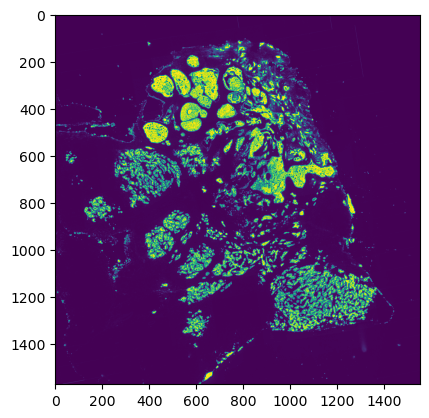

In [13]:
plt.imshow(thumbnail[channels.index('Pan-Cytokeratin')])

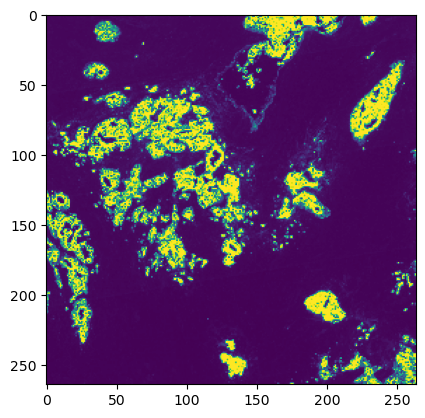

In [14]:
plt.imshow(thumbnail[channels.index('Pan-Cytokeratin'), 500:764, 500:764])

In [15]:
class MAETransform(object):
    def __init__(self, size=(256, 256), normalize=None):
        self.transforms = Compose([
            RandomCrop(size, padding_mode='reflect'),
            RandomHorizontalFlip(),
            RandomVerticalFlip(),
            normalize if normalize is not None else nn.Identity()
        ])

    def __call__(self, anchor, pos, neg):
        anchor, pos = self.transforms(torch.stack((anchor, pos)))
        neg = self.transforms(neg)
        return torch.stack((anchor, pos, neg))
    
class InferenceTransform(object):
    def __init__(self, normalize=None):
        self.transforms = Compose([
            normalize if normalize is not None else nn.Identity()
        ])

    def __call__(self, x):
        return self.transforms(x)
    
class SlideDataset(Dataset):
    def __init__(self, slide_to_img, transform=None):
        self.slides = sorted(slide_to_img.keys())
        self.slide_to_img = slide_to_img

        self.transform = transform if transform is not None else nn.Identity()

    def __len__(self):
        return np.iinfo(np.int64).max # make infinite

    def __getitem__(self, idx):
        anchor_slide = np.random.choice(self.slides)
        anchor_idx = self.slides.index(anchor_slide)
        
        if anchor_idx == 0:
            pos_idx = 1
        elif anchor_idx == len(self.slides) - 1:
            pos_idx = anchor_idx - 1
        else:
            pos_idx = np.random.choice([anchor_idx - 1, anchor_idx + 1])
        pos_slide = self.slides[pos_idx]
        
        neg_slide = np.random.choice(self.slides)
        neg_idx = self.slides.index(anchor_slide)
        
        anchor_img, pos_img, neg_img = transform(
            *[self.slide_to_img[slide] for slide in [anchor_slide, pos_slide, neg_slide]]
        )
        
        return {
            'anchor_idx': anchor_idx,
            'pos_idx': pos_idx,
            'neg_idx': neg_idx,
            'anchor_img': anchor_img,
            'pos_img': pos_img,
            'neg_img': neg_img,
        }

class InferenceSlideDataset(Dataset):
    def __init__(self, slide_to_img, size=(256, 256), transform=None):
        """"""
        self.size = size
        self.slides = sorted(slide_to_img.keys())
        self.slide_to_img = slide_to_img
        
        # tiles are (ph pw c h w)
        self.slide_to_tiles = {s:self.to_tiles(x) for s, x in self.slide_to_img.items()}
        self.pw, self.ph = self.slide_to_tiles[self.slides[0]].shape[:2]
        
        self.n_tiles_per_image = self.pw * self.ph
        outs = torch.stack(torch.meshgrid(
            torch.arange(len(self.slides)),
            torch.arange(self.slide_to_tiles[self.slides[0]].shape[0]),
            torch.arange(self.slide_to_tiles[self.slides[0]].shape[1])
        ))
        self.idx_to_coord = rearrange(
            outs, 'b n_slides n_rows n_cols -> (n_slides n_rows n_cols) b',
            n_slides=len(self.slides), n_rows=self.ph, n_cols=self.pw, b=3)


        self.transform = transform if transform is not None else nn.Identity()
        
    def to_tiles(self, x, size=None):
        size = self.size if size is None else size
        pad_h, pad_w = size[-2] - x.shape[-2] % size[-2], size[-1] - x.shape[-1] % size[-1]
        # left, top, right and bottom
        x = TF.pad(x, [pad_w // 2, pad_h // 2, pad_w // 2 + pad_w % 2, pad_h // 2 + pad_h % 2])
        x = x.unfold(-2, size[-2], size[-2] // 2)
        x = x.unfold(-2, size[-1], size[-1] // 2)
        x = rearrange(x, 'c ph pw h w -> ph pw c h w')
        return x

    def image_from_tiles(self, x):
        pad_h, pad_w = x.shape[-2] // 4, x.shape[-1] // 4
        x = x[..., pad_h:-pad_h, pad_w:-pad_w]
        return rearrange(x, 'ph pw c h w -> c (ph h) (pw w)')
    
    def slide_from_tiles(self, x, slide_idx, size=None):
        """
        x - (n c h w)
        """
        size = self.size if size is None else size
        mask = self.idx_to_coord[:, 0]==slide_idx
        tiles = x[mask]
        ph, pw = self.idx_to_coord[mask, 1].max() + 1, self.idx_to_coord[mask, 2].max() + 1
        
        out = torch.zeros(ph, pw, x.shape[1], size[0], size[1])
        for idx, (_, r, c) in enumerate(self.idx_to_coord[mask]):
            out[r, c] = tiles[idx]
        
        return self.image_from_tiles(out)

    def __len__(self):
        return self.idx_to_coord.shape[0]

    def __getitem__(self, idx):
        slide_idx, row_idx, col_idx = self.idx_to_coord[idx]
        slide = self.slides[slide_idx]
        return {
            'slide_idx': slide_idx,
            'row_idx': row_idx,
            'col_idx': col_idx,
            'img': transform(self.slide_to_tiles[slide][row_idx, col_idx])
        }

In [172]:
means = torch.cat([x.mean(dim=(-2, -1)).unsqueeze(0) for x in slide_to_img.values()]).mean(0)
stds = torch.cat([x.std(dim=(-2, -1)).unsqueeze(0) for x in slide_to_img.values()]).mean(0)
means, stds

(tensor([ 0.0801,  1.0852,  1.9242,  0.4242,  1.5283,  6.9707,  0.4142, 10.0162,
          3.5788,  0.2126, 11.7128,  5.6175,  6.0933,  0.1766,  1.1214,  4.9701,
          2.3110,  6.1405, 19.0076,  0.4349,  4.8628, 21.0575,  0.6115]),
 tensor([ 0.8096,  6.8269,  4.6411,  2.7208, 11.1956, 24.7025,  1.5357, 13.1523,
         10.1505,  1.7475, 36.9418, 14.6443, 21.0886,  0.8051, 10.7819,  9.9388,
          5.4503, 13.5437, 52.9554,  1.8941, 21.8240, 44.8913,  1.7298]))

In [173]:
size = (256, 256)

normalize = Normalize(means, stds)
transform = MAETransform(normalize=normalize)
ds = SlideDataset(slide_to_img, transform=transform)

In [174]:
d = ds[0]
d.keys()

dict_keys(['anchor_idx', 'pos_idx', 'neg_idx', 'anchor_img', 'pos_img', 'neg_img'])

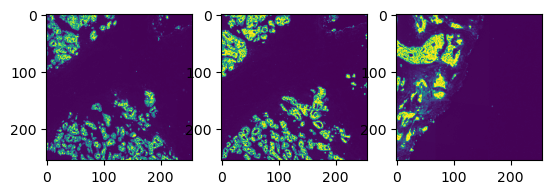

In [175]:
fig, axs = plt.subplots(ncols=3)
axs[0].imshow(d['anchor_img'][channels.index('Pan-Cytokeratin')])
axs[1].imshow(d['pos_img'][channels.index('Pan-Cytokeratin')])
axs[2].imshow(d['neg_img'][channels.index('Pan-Cytokeratin')])

In [176]:
d['anchor_idx'], d['pos_idx'], d['neg_idx']

(1, 0, 1)

In [177]:
dl = DataLoader(ds, batch_size=32, num_workers=5)

In [178]:
# from vector_quantize_pytorch import VectorQuantize

In [456]:
# vq = VectorQuantize(
#     dim = 256,
#     codebook_size = 512,     # codebook size
#     decay = 0.8,             # the exponential moving average decay, lower means the dictionary will change faster
#     commitment_weight = 1.   # the weight on the commitment loss
# )

In [457]:
# vq.codebook.shape

In [458]:
# x = torch.randn(32, 64, 256)

In [459]:
# quantized, indices, commit_loss = vq(x)

In [460]:
# quantized.shape

In [505]:
anchor_embs = torch.rand(32, 64, 1024)
pos_embs = torch.rand(32, 64, 1024) * .19 + anchor_embs
neg_embs = torch.rand(32, 64, 1024) * .8 + anchor_embs

anchor_embs = rearrange(anchor_embs, 'b n d -> (b n) d')
pos_embs = rearrange(pos_embs, 'b n d -> (b n) d')
neg_embs = rearrange(neg_embs, 'b n d -> (b n) d')

In [484]:
anchor_embs.shape

torch.Size([2048, 1024])

In [494]:
F.cosine_embedding_loss(
    anchor_embs, pos_embs, torch.ones(anchor_embs.shape[0]))

tensor(0.0060)

In [506]:
F.cosine_embedding_loss(
    anchor_embs, neg_embs, -torch.ones(anchor_embs.shape[0]))

tensor(0.9495)

In [463]:
import torch.nn.functional as F
F.triplet_margin_loss(anchor_embs, pos_embs, neg_embs, margin=.1)

tensor(0.1842)

In [179]:
v = ViT(
    image_size = size[0],
    patch_size = 32,
    num_classes = 1000,
    dim = 1024,
    depth = 6,
    heads = 8,
    mlp_dim = 2048,
    channels=len(channels),
)

In [180]:
codebook_size = 20
mae = SlideAEV2(
    encoder = v,
    n_slides = len(slide_to_img),
    decoder_dim = 512,      # paper showed good results with just 512
    decoder_depth = 6,       # anywhere from 1 to 8
    codebook_size = codebook_size,
    triplet_scaler = 1.,
    recon_scaler = 1.
)

In [24]:
b = next(iter(dl))

In [25]:
img_x = torch.stack((b['anchor_img'], b['pos_img'], b['neg_img']))
slide_x = torch.stack((b['anchor_idx'], b['pos_idx'], b['neg_idx']))
losses, outputs = mae(
    img_x, slide_x
)
losses

{'overall_loss': tensor(2.4908, grad_fn=<AddBackward0>),
 'recon_loss': tensor(2.0197, grad_fn=<DivBackward0>),
 'triplet_loss': tensor(0.4710, grad_fn=<AddBackward0>)}

In [469]:
pred_pixel_values = outputs[0]['pred_pixel_values']
pred_pixel_values.shape

torch.Size([32, 64, 23552])

In [32]:
from einops import rearrange

In [471]:
pred_patches = rearrange(
    pred_pixel_values, 'b (h w) (p1 p2 c) -> b c (h p1) (w p2)',
    h=size[0] // 32, w=size[0] // 32, p1=32, p2=32, c=len(channels))
pred_patches.shape

torch.Size([32, 23, 256, 256])

In [472]:
# mae = SlideMAE(
#     encoder = v,
#     n_slides = len(slide_to_img),
#     masking_ratio = 0.25,   # the paper recommended 75% masked patches
#     decoder_dim = 512,      # paper showed good results with just 512
#     decoder_depth = 6       # anywhere from 1 to 8
# )

In [26]:
v = v.cuda()
mae = mae.cuda()

In [181]:
iters = 5000
lr = 1e-4
opt = torch.optim.Adam(mae.parameters(), lr=lr)

In [182]:
out_dir = '../data/mae_v13'

In [183]:
from pathlib import Path
import os
Path(out_dir).mkdir(parents=True, exist_ok=True)

In [184]:
# channel_idx = channels.index('Pan-Cytokeratin')
channel_idx = channels.index('CD45')
channel_idx

2

0 {'overall_loss': tensor(2.5047, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(2.0550, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.4497, device='cuda:0', grad_fn=<AddBackward0>)}


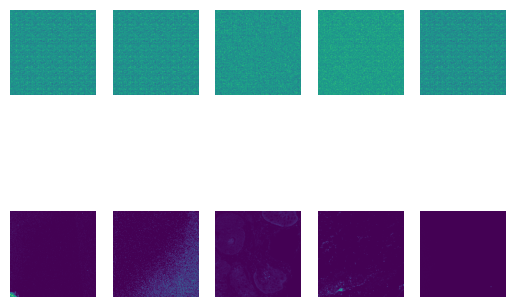

10 {'overall_loss': tensor(1.5179, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3598, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.1581, device='cuda:0', grad_fn=<AddBackward0>)}


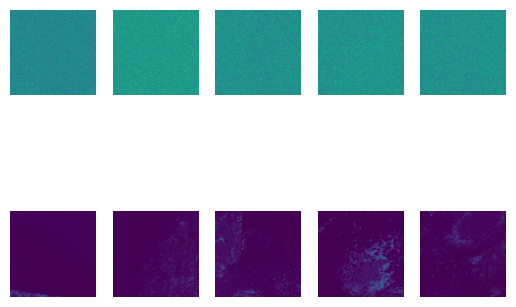

20 {'overall_loss': tensor(1.3801, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2873, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0928, device='cuda:0', grad_fn=<AddBackward0>)}


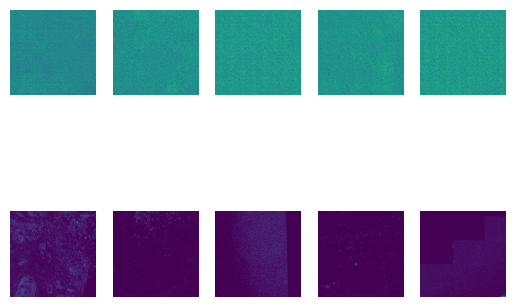

30 {'overall_loss': tensor(1.4397, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3692, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0706, device='cuda:0', grad_fn=<AddBackward0>)}


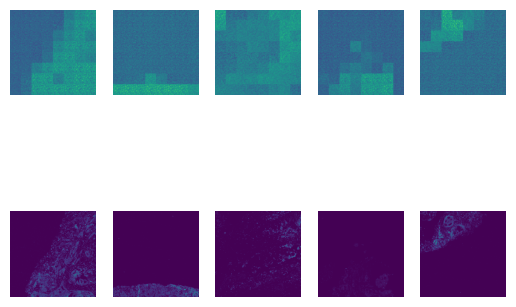

40 {'overall_loss': tensor(1.2644, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2063, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0580, device='cuda:0', grad_fn=<AddBackward0>)}


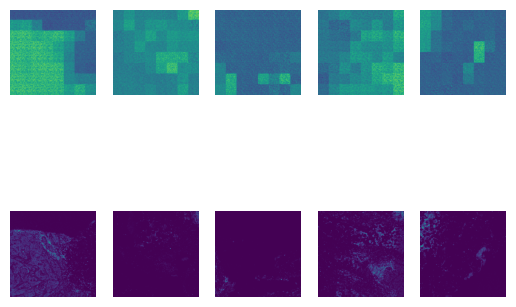

50 {'overall_loss': tensor(1.3825, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2871, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0954, device='cuda:0', grad_fn=<AddBackward0>)}


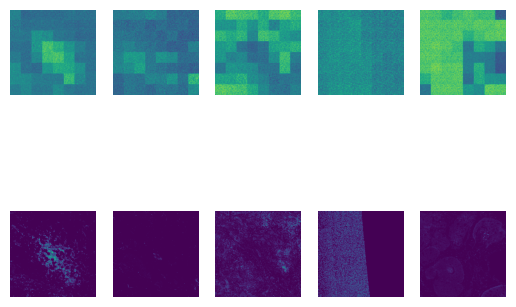

60 {'overall_loss': tensor(1.2570, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1788, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0782, device='cuda:0', grad_fn=<AddBackward0>)}


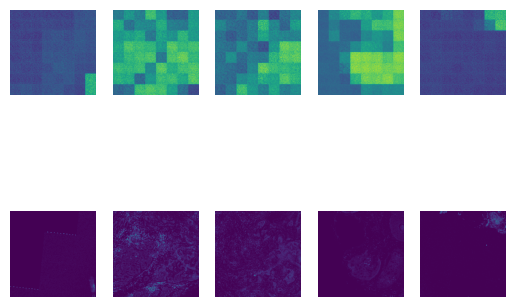

70 {'overall_loss': tensor(1.4533, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3775, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0757, device='cuda:0', grad_fn=<AddBackward0>)}


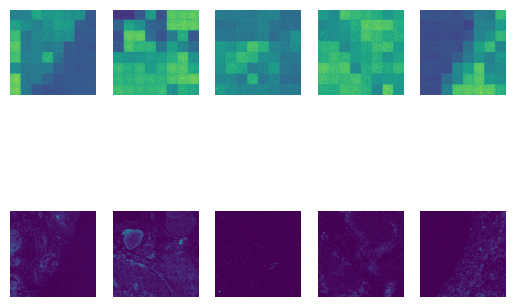

80 {'overall_loss': tensor(1.1156, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0874, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0283, device='cuda:0', grad_fn=<AddBackward0>)}


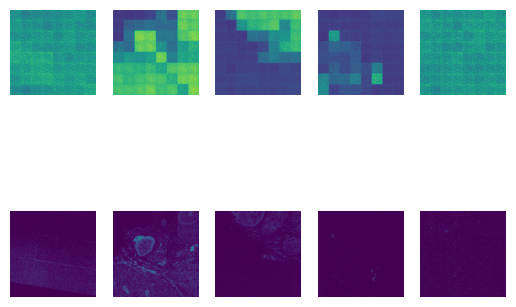

90 {'overall_loss': tensor(1.5008, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.4423, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0585, device='cuda:0', grad_fn=<AddBackward0>)}


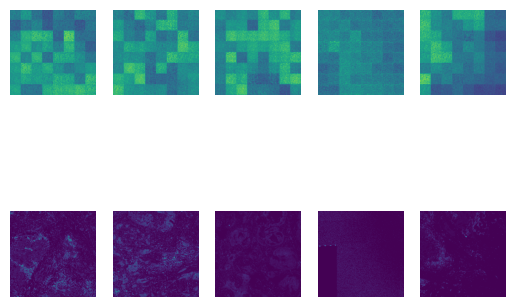

100 {'overall_loss': tensor(1.3580, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3136, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0444, device='cuda:0', grad_fn=<AddBackward0>)}


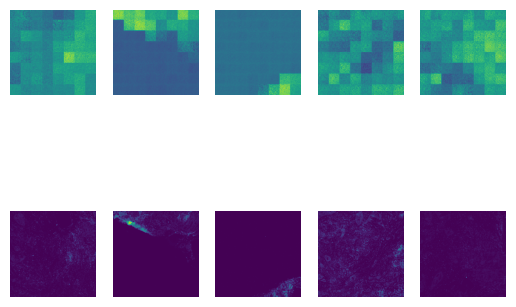

110 {'overall_loss': tensor(1.1484, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1253, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0231, device='cuda:0', grad_fn=<AddBackward0>)}


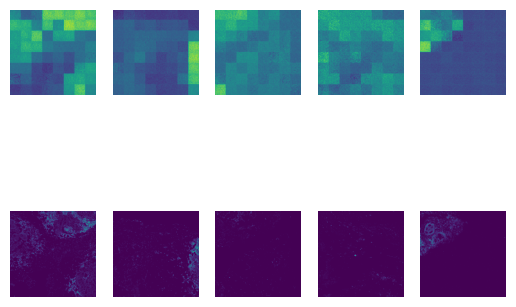

120 {'overall_loss': tensor(1.1030, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0435, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0595, device='cuda:0', grad_fn=<AddBackward0>)}


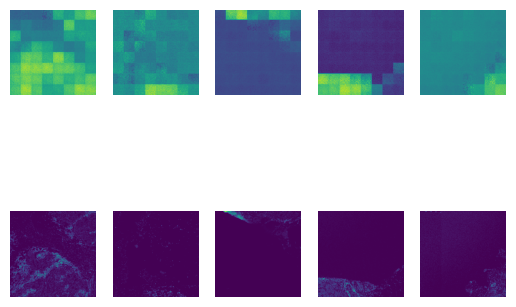

130 {'overall_loss': tensor(1.5041, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.4651, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0390, device='cuda:0', grad_fn=<AddBackward0>)}


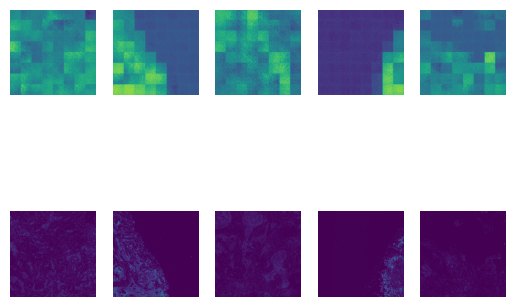

140 {'overall_loss': tensor(1.3962, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3601, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0361, device='cuda:0', grad_fn=<AddBackward0>)}


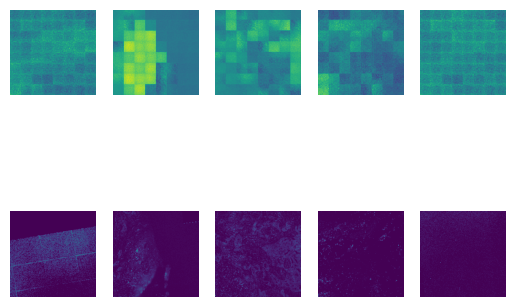

150 {'overall_loss': tensor(1.0925, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0715, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0210, device='cuda:0', grad_fn=<AddBackward0>)}


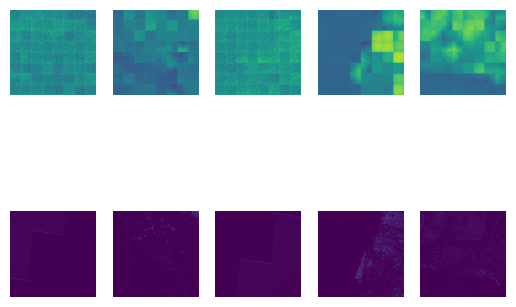

160 {'overall_loss': tensor(1.1399, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1164, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0236, device='cuda:0', grad_fn=<AddBackward0>)}


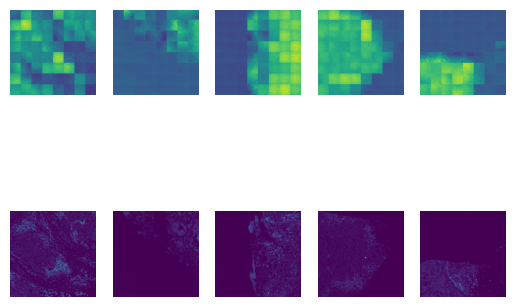

170 {'overall_loss': tensor(1.2851, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2234, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0617, device='cuda:0', grad_fn=<AddBackward0>)}


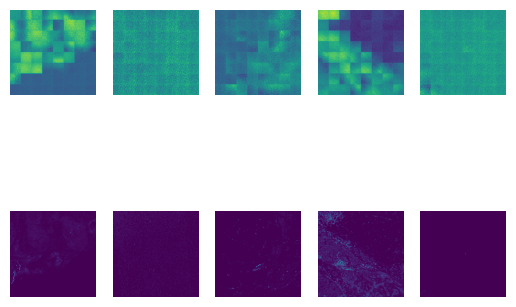

180 {'overall_loss': tensor(1.4292, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3453, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0839, device='cuda:0', grad_fn=<AddBackward0>)}


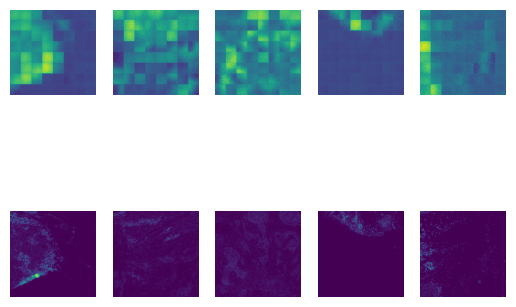

190 {'overall_loss': tensor(1.2273, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1909, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0363, device='cuda:0', grad_fn=<AddBackward0>)}


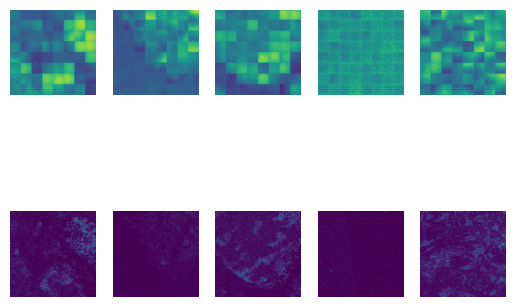

200 {'overall_loss': tensor(1.0471, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0321, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0151, device='cuda:0', grad_fn=<AddBackward0>)}


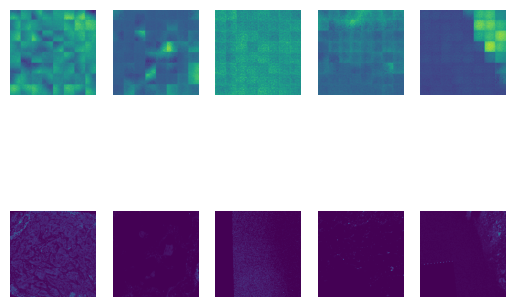

210 {'overall_loss': tensor(1.0837, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0505, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0332, device='cuda:0', grad_fn=<AddBackward0>)}


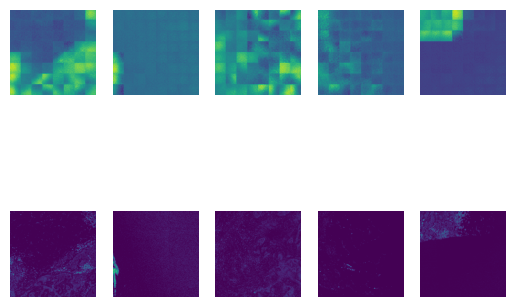

220 {'overall_loss': tensor(1.1776, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1603, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0173, device='cuda:0', grad_fn=<AddBackward0>)}


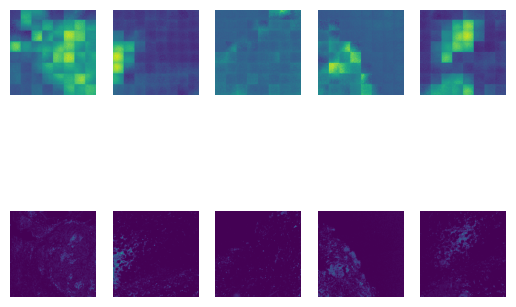

230 {'overall_loss': tensor(1.0896, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0594, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0302, device='cuda:0', grad_fn=<AddBackward0>)}


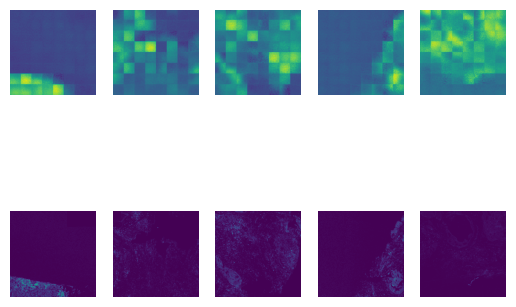

240 {'overall_loss': tensor(1.1696, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1541, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0155, device='cuda:0', grad_fn=<AddBackward0>)}


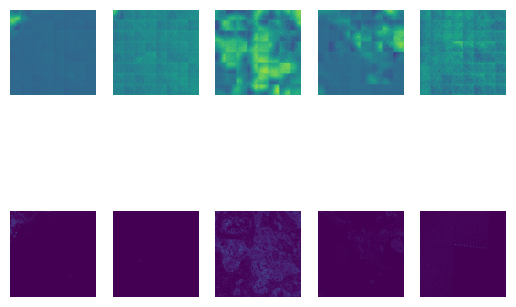

250 {'overall_loss': tensor(1.1469, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0983, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0486, device='cuda:0', grad_fn=<AddBackward0>)}


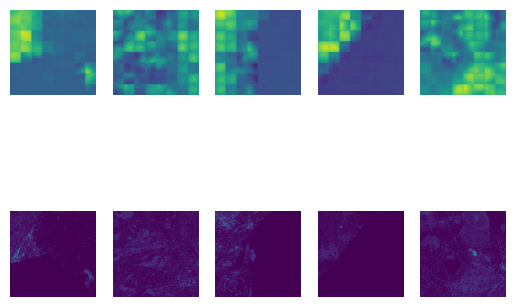

260 {'overall_loss': tensor(1.1231, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0905, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0326, device='cuda:0', grad_fn=<AddBackward0>)}


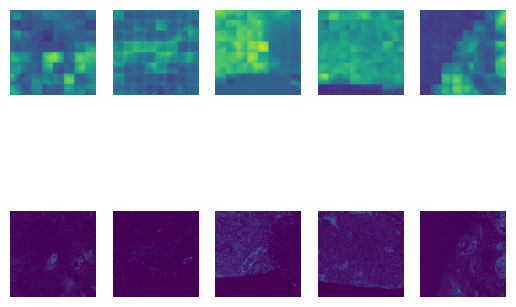

270 {'overall_loss': tensor(1.1736, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1289, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0447, device='cuda:0', grad_fn=<AddBackward0>)}


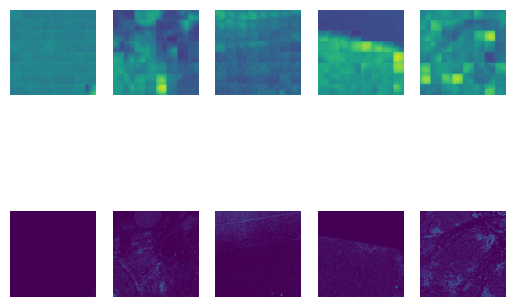

280 {'overall_loss': tensor(1.1972, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1647, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0325, device='cuda:0', grad_fn=<AddBackward0>)}


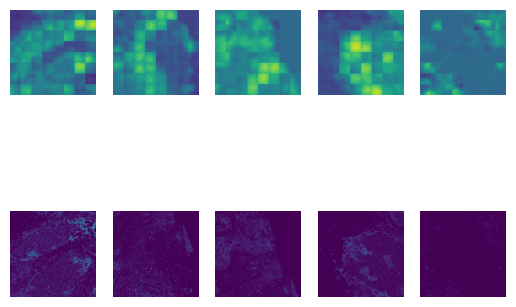

290 {'overall_loss': tensor(1.1118, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1008, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0110, device='cuda:0', grad_fn=<AddBackward0>)}


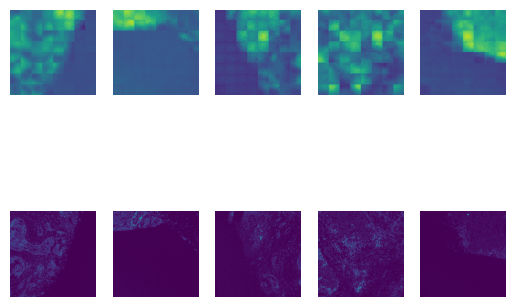

300 {'overall_loss': tensor(1.2426, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1949, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0477, device='cuda:0', grad_fn=<AddBackward0>)}


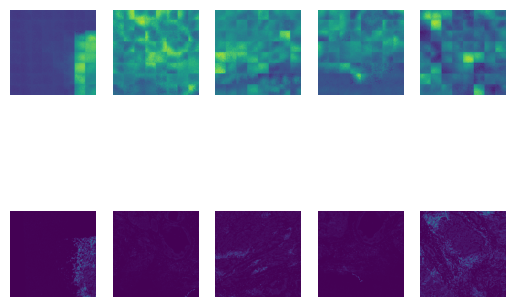

310 {'overall_loss': tensor(1.1187, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0889, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0298, device='cuda:0', grad_fn=<AddBackward0>)}


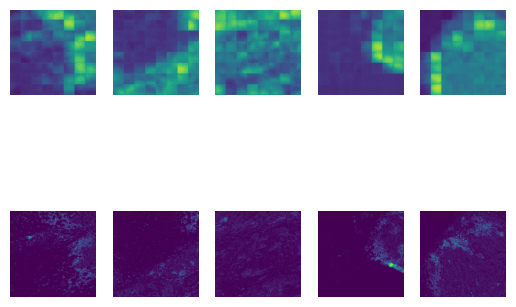

320 {'overall_loss': tensor(1.1896, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1733, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0164, device='cuda:0', grad_fn=<AddBackward0>)}


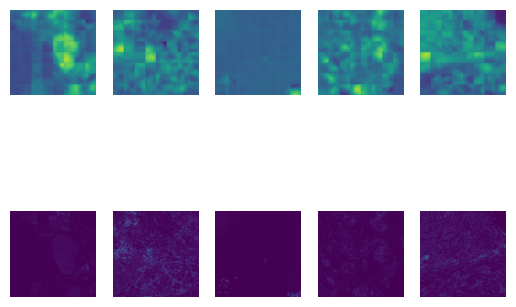

330 {'overall_loss': tensor(1.2291, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2157, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0134, device='cuda:0', grad_fn=<AddBackward0>)}


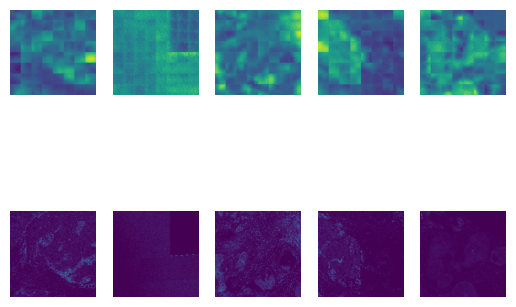

340 {'overall_loss': tensor(1.1320, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1023, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0297, device='cuda:0', grad_fn=<AddBackward0>)}


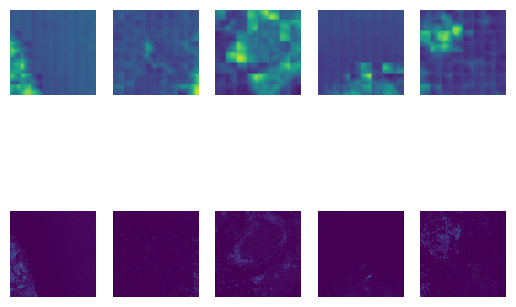

350 {'overall_loss': tensor(1.3177, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2861, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0316, device='cuda:0', grad_fn=<AddBackward0>)}


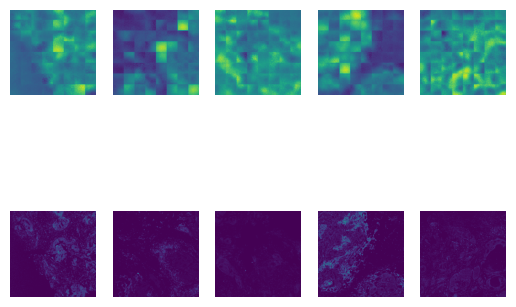

360 {'overall_loss': tensor(1.1461, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1144, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0317, device='cuda:0', grad_fn=<AddBackward0>)}


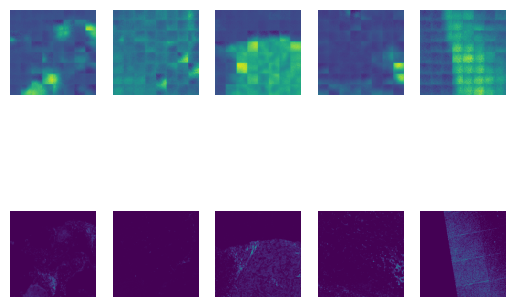

370 {'overall_loss': tensor(0.9920, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9793, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0127, device='cuda:0', grad_fn=<AddBackward0>)}


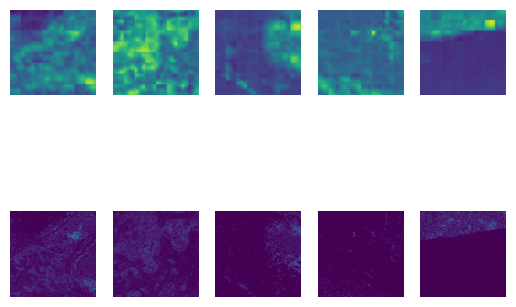

380 {'overall_loss': tensor(1.2123, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1835, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0288, device='cuda:0', grad_fn=<AddBackward0>)}


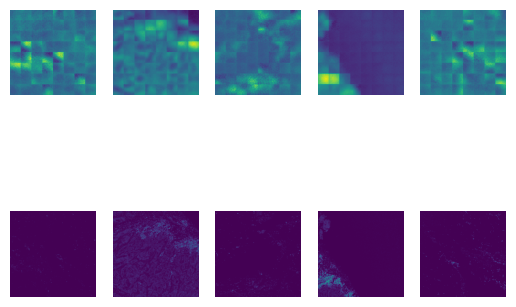

390 {'overall_loss': tensor(1.2334, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2165, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0169, device='cuda:0', grad_fn=<AddBackward0>)}


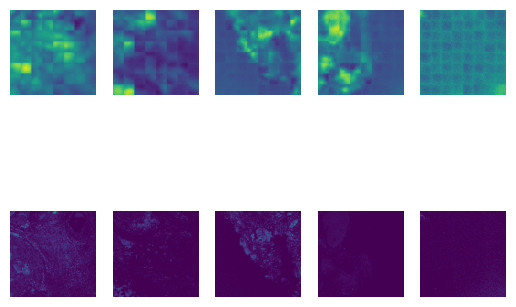

400 {'overall_loss': tensor(1.0537, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0263, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0274, device='cuda:0', grad_fn=<AddBackward0>)}


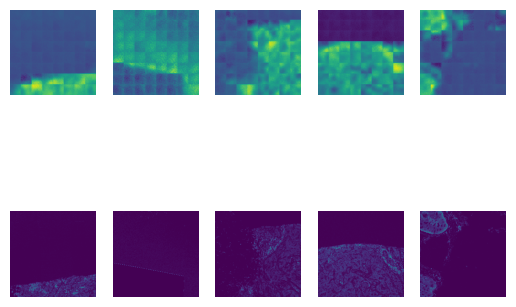

410 {'overall_loss': tensor(1.1910, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1466, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0444, device='cuda:0', grad_fn=<AddBackward0>)}


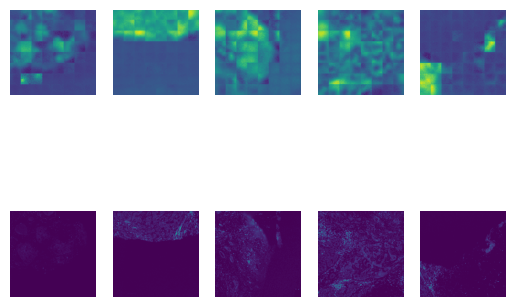

420 {'overall_loss': tensor(1.2014, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1881, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0133, device='cuda:0', grad_fn=<AddBackward0>)}


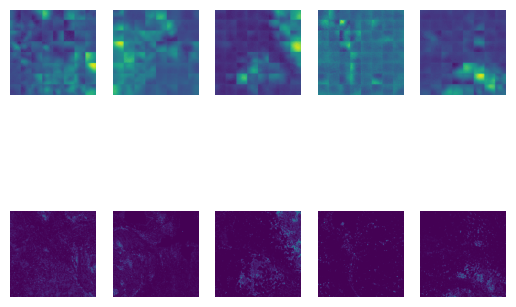

430 {'overall_loss': tensor(1.2985, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2868, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0116, device='cuda:0', grad_fn=<AddBackward0>)}


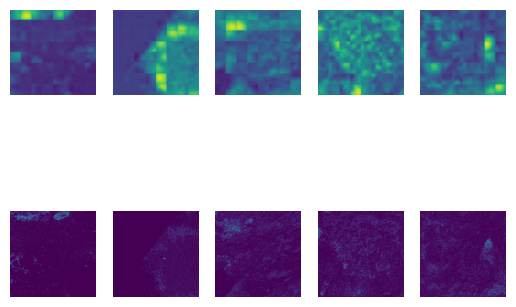

440 {'overall_loss': tensor(1.0876, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0571, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0305, device='cuda:0', grad_fn=<AddBackward0>)}


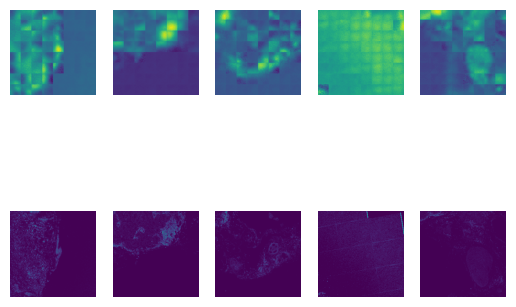

450 {'overall_loss': tensor(1.1357, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1241, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0116, device='cuda:0', grad_fn=<AddBackward0>)}


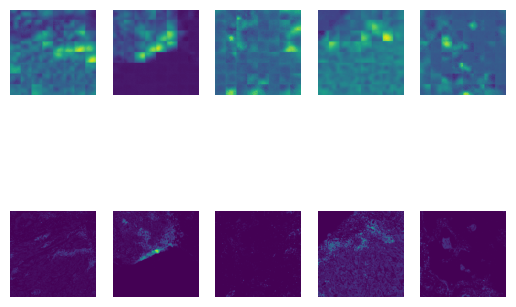

460 {'overall_loss': tensor(1.0194, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0091, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0103, device='cuda:0', grad_fn=<AddBackward0>)}


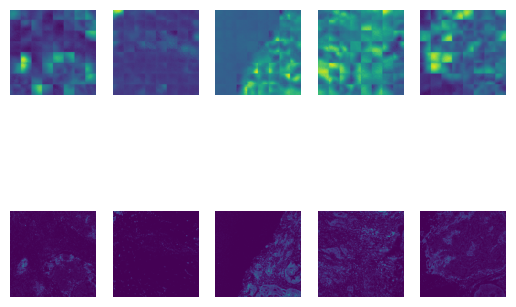

470 {'overall_loss': tensor(1.0122, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9859, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0264, device='cuda:0', grad_fn=<AddBackward0>)}


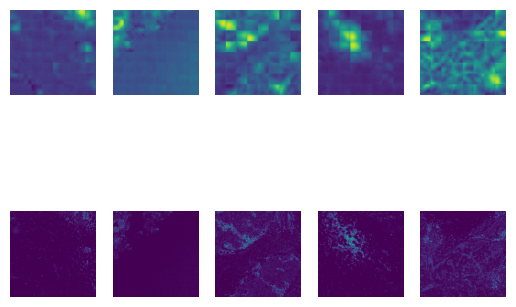

480 {'overall_loss': tensor(1.1274, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1135, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0140, device='cuda:0', grad_fn=<AddBackward0>)}


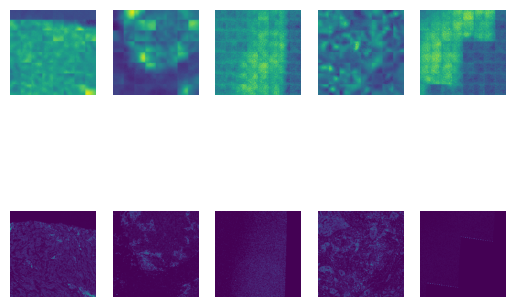

490 {'overall_loss': tensor(0.7680, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.7580, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0100, device='cuda:0', grad_fn=<AddBackward0>)}


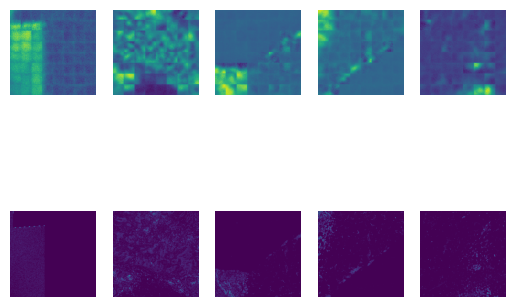

500 {'overall_loss': tensor(1.2155, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.2043, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0111, device='cuda:0', grad_fn=<AddBackward0>)}


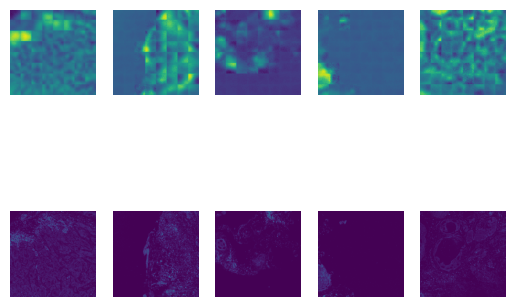

510 {'overall_loss': tensor(1.1230, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0933, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0297, device='cuda:0', grad_fn=<AddBackward0>)}


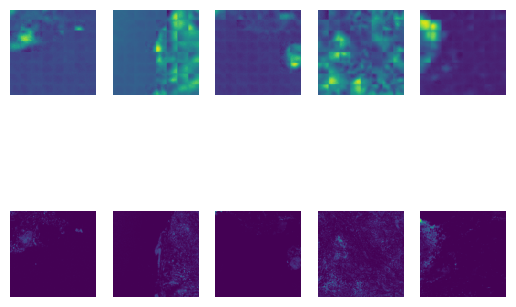

520 {'overall_loss': tensor(1.0306, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0197, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0109, device='cuda:0', grad_fn=<AddBackward0>)}


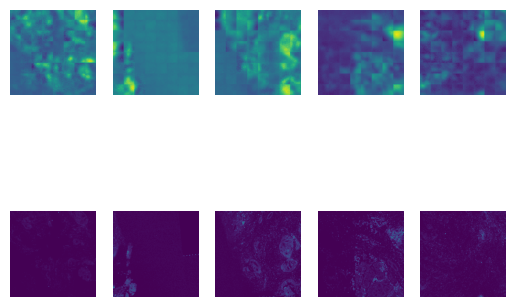

530 {'overall_loss': tensor(1.0765, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0651, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0114, device='cuda:0', grad_fn=<AddBackward0>)}


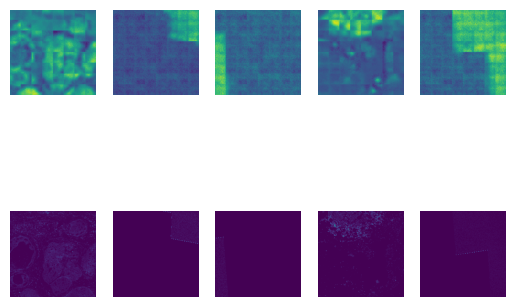

540 {'overall_loss': tensor(1.1696, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1381, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0314, device='cuda:0', grad_fn=<AddBackward0>)}


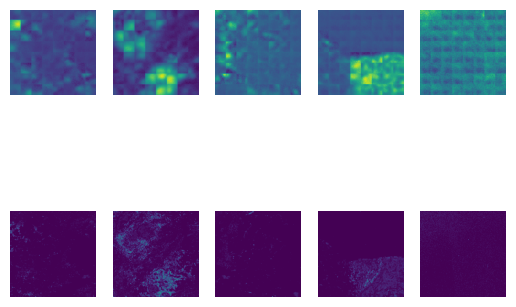

550 {'overall_loss': tensor(1.1814, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1217, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0596, device='cuda:0', grad_fn=<AddBackward0>)}


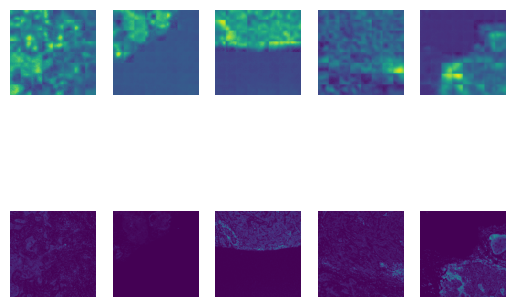

560 {'overall_loss': tensor(0.9523, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9428, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0095, device='cuda:0', grad_fn=<AddBackward0>)}


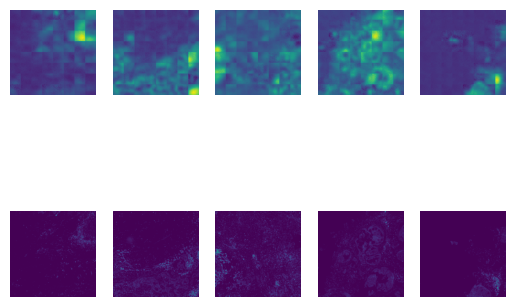

570 {'overall_loss': tensor(1.2096, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1673, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0423, device='cuda:0', grad_fn=<AddBackward0>)}


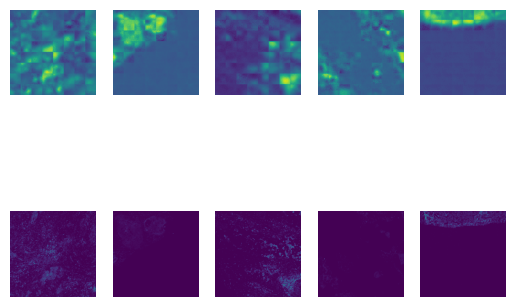

580 {'overall_loss': tensor(1.0837, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0577, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0260, device='cuda:0', grad_fn=<AddBackward0>)}


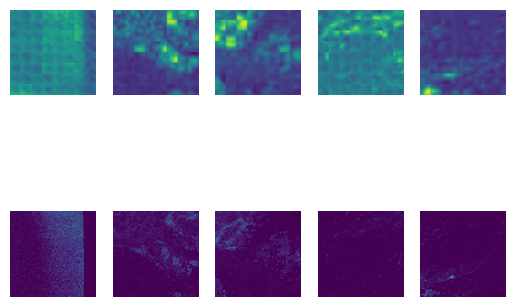

590 {'overall_loss': tensor(0.9961, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9832, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0129, device='cuda:0', grad_fn=<AddBackward0>)}


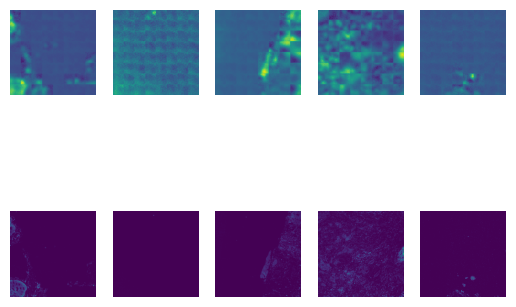

600 {'overall_loss': tensor(1.0732, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0619, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0113, device='cuda:0', grad_fn=<AddBackward0>)}


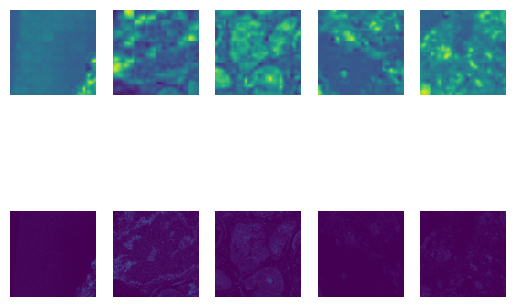

610 {'overall_loss': tensor(1.0579, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9875, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0705, device='cuda:0', grad_fn=<AddBackward0>)}


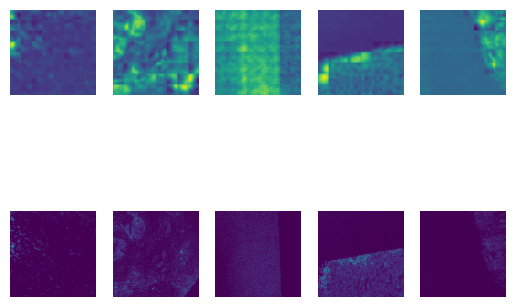

620 {'overall_loss': tensor(1.1797, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1532, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0265, device='cuda:0', grad_fn=<AddBackward0>)}


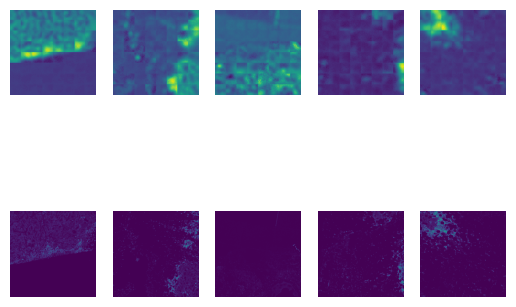

630 {'overall_loss': tensor(0.9675, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9593, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0082, device='cuda:0', grad_fn=<AddBackward0>)}


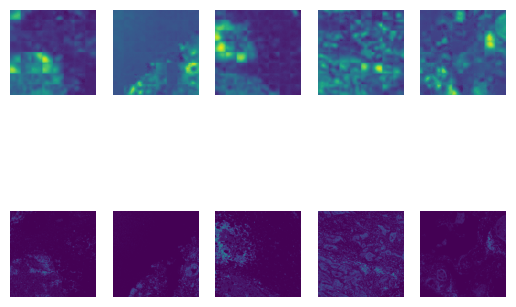

640 {'overall_loss': tensor(1.0343, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0077, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0266, device='cuda:0', grad_fn=<AddBackward0>)}


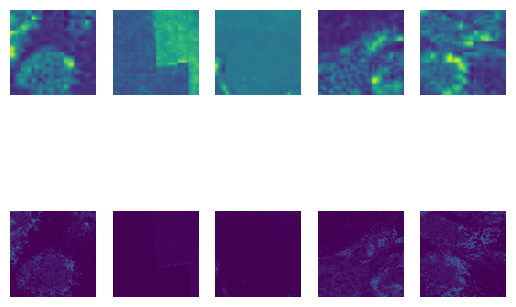

650 {'overall_loss': tensor(1.1459, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1016, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0443, device='cuda:0', grad_fn=<AddBackward0>)}


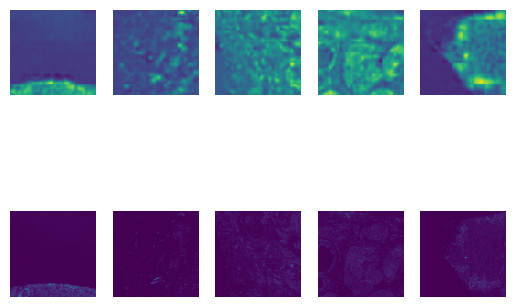

660 {'overall_loss': tensor(1.0641, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0533, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0108, device='cuda:0', grad_fn=<AddBackward0>)}


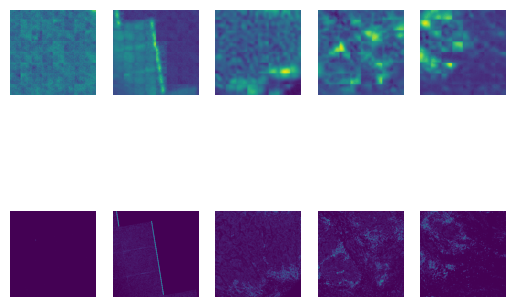

670 {'overall_loss': tensor(1.0048, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.9460, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0587, device='cuda:0', grad_fn=<AddBackward0>)}


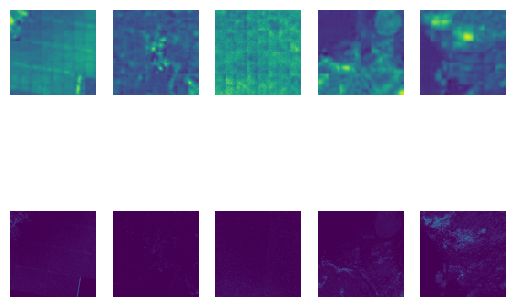

680 {'overall_loss': tensor(1.0586, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0463, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0122, device='cuda:0', grad_fn=<AddBackward0>)}


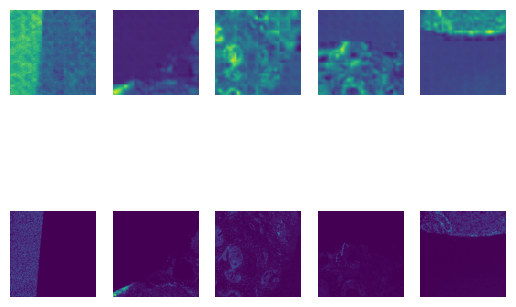

690 {'overall_loss': tensor(1.1543, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1419, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0124, device='cuda:0', grad_fn=<AddBackward0>)}


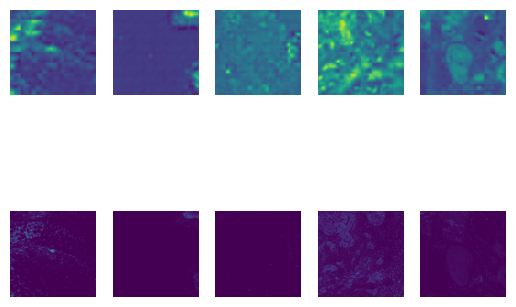

700 {'overall_loss': tensor(1.0864, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0621, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0243, device='cuda:0', grad_fn=<AddBackward0>)}


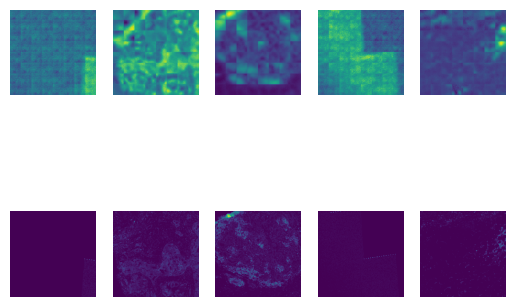

710 {'overall_loss': tensor(1.0143, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0041, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0102, device='cuda:0', grad_fn=<AddBackward0>)}


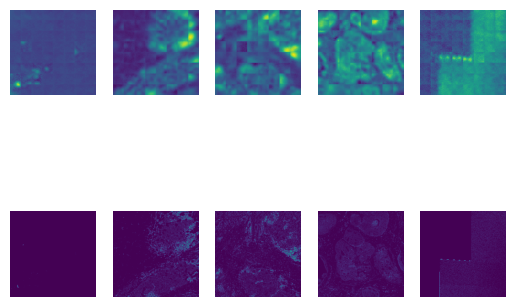

KeyboardInterrupt: 

In [33]:
for i, b in enumerate(dl):
    opt.zero_grad()
    
    img_x = torch.stack((b['anchor_img'], b['pos_img'], b['neg_img']))
    slide_x = torch.stack((b['anchor_idx'], b['pos_idx'], b['neg_idx']))
    img_x, slide_x = img_x.cuda(), slide_x.cuda()
    losses, outputs = mae(img_x, slide_x)
    loss = losses['overall_loss']
    loss.backward()
    opt.step()
    
    if i % 10 == 0:
        print(i, losses)
        
        pred_pixel_values = outputs[0]['pred_pixel_values']
        pred_patches = rearrange(
            pred_pixel_values, 'b (h w) (p1 p2 c) -> b c (h p1) (w p2)',
            h=size[0] // 32, w=size[0] // 32, p1=32, p2=32, c=len(channels))
        
        fig, axs = plt.subplots(nrows=2, ncols=5)
        for c in range(axs.shape[1]):
            ax1, ax2 = axs[:, c]
            ax1.imshow(pred_patches[c, channel_idx].cpu().detach())
            ax1.axis('off')
            ax2.imshow(img_x[0, c, channel_idx].cpu().detach())
            ax2.axis('off')
            if c==0:
                ax1.set_ylabel('pred')
                ax2.set_ylabel('true')
        plt.show()
            
        
    if i % 100 == 0:
        torch.save(mae.state_dict(), os.path.join(out_dir, f'{i}iter.pt'))
        
    if i == iters:
        break

In [185]:
%%time 
for i, b in enumerate(dl):
    print(i)
    opt.zero_grad()
    
    img_x = torch.stack((b['anchor_img'], b['pos_img'], b['neg_img']))
    slide_x = torch.stack((b['anchor_idx'], b['pos_idx'], b['neg_idx']))
#     img_x, slide_x = img_x.cuda(), slide_x.cuda()
    losses, outputs = mae(img_x, slide_x)
    loss = losses['overall_loss']
    loss.backward()
    opt.step()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36


KeyboardInterrupt: 

In [ ]:
# torch.save(v.state_dict(), f'../data/mae_v3/1500iter.pt')

In [122]:
size = (256, 256)

normalize = Normalize(means, stds)
transform = InferenceTransform(normalize=normalize)
inference_ds = InferenceSlideDataset(slide_to_img, transform=transform)

In [123]:
inference_dl = DataLoader(inference_ds, batch_size=32, shuffle=False)

In [124]:
x = inference_ds.image_from_tiles(inference_ds.slide_to_tiles[inference_ds.slides[0]])
x.shape

torch.Size([23, 1664, 1664])

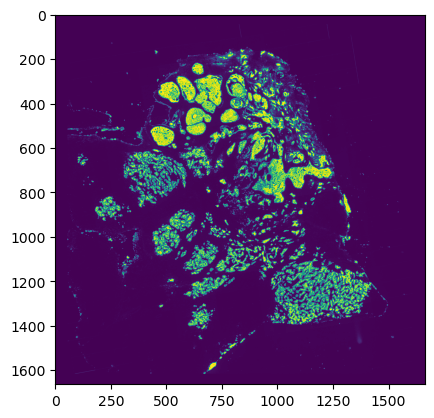

In [125]:
plt.imshow(x[channels.index('Pan-Cytokeratin')])

In [126]:
v = ViT(
    image_size = size[0],
    patch_size = 32,
    num_classes = 1000,
    dim = 1024,
    depth = 6,
    heads = 8,
    mlp_dim = 2048,
    channels=len(channels),
)

In [127]:
mae = SlideAE(
    encoder = v,
    n_slides = len(slide_to_img),
    decoder_dim = 512,      # paper showed good results with just 512
    decoder_depth = 6,       # anywhere from 1 to 8
    codebook_size = codebook_size,
)

In [128]:
# mae.load_state_dict(torch.load('../data/mae_v13/250iter.pt'))
# mae.load_state_dict(torch.load('../data/mae_v13/5000iter.pt'))
# mae.load_state_dict(torch.load('../data/mae_v13/700iter.pt'))
mae.load_state_dict(torch.load('../data/mae_v13/100iter.pt'))

<All keys matched successfully>

In [129]:
mae.eval()

SlideAE(
  (encoder): ViT(
    (to_patch_embedding): Sequential(
      (0): Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=32, p2=32)
      (1): LayerNorm((23552,), eps=1e-05, elementwise_affine=True)
      (2): Linear(in_features=23552, out_features=1024, bias=True)
      (3): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    )
    (dropout): Dropout(p=0.0, inplace=False)
    (transformer): Transformer(
      (layers): ModuleList(
        (0): ModuleList(
          (0): PreNorm(
            (norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
            (fn): Attention(
              (attend): Softmax(dim=-1)
              (dropout): Dropout(p=0.0, inplace=False)
              (to_qkv): Linear(in_features=1024, out_features=1536, bias=False)
              (to_out): Sequential(
                (0): Linear(in_features=512, out_features=1024, bias=True)
                (1): Dropout(p=0.0, inplace=False)
              )
            )
          )
          (1): 

In [130]:
# all_encoded_tokens_prequantize = torch.zeros(
#     len(inference_ds), size[0] // 32, size[1] // 32, v.pos_embedding.shape[-1])
# all_encoded_tokens = torch.zeros(len(inference_ds), size[0] // 32, size[1] // 32, v.pos_embedding.shape[-1])
# all_decoded_tokens = torch.zeros(len(inference_ds), size[0] // 32, size[1] // 32, mae.decoder_dim)
# all_pred_patches = torch.zeros(len(inference_ds), len(channels), size[0], size[1])
# all_indices = torch.zeros(len(inference_ds), size[0] // 32, size[1] // 32, dtype=torch.long)
# bs = inference_dl.batch_size
# with torch.no_grad():
#     for i, b in enumerate(inference_dl):
#         x, slide_idx = b['img'], b['slide_idx']
#         if v.pos_embedding.is_cuda:
#             x, slide_idx = x.to(v.pos_embedding.device), slide_idx.to(v.pos_embedding.device)
        
#         encoded_tokens_prequantize = mae.encode(x, slide_idx)
#         encoded_tokens, indices, _ = mae.quantize(encoded_tokens_prequantize)
#         decoded_tokens = mae.decode(encoded_tokens)
#         pred_pixel_values = mae.to_pixels(decoded_tokens[:, 1:])

#         encoded_tokens_prequantize = rearrange(encoded_tokens_prequantize[:, 1:], 'b (h w) d -> b h w d',
#                                   h=size[0] // 32, w=size[1] // 32)
#         encoded_tokens = rearrange(encoded_tokens[:, 1:], 'b (h w) d -> b h w d',
#                                   h=size[0] // 32, w=size[1] // 32)
#         indices = rearrange(indices, 'b (h w) -> b h w',
#                                   h=size[0] // 32, w=size[1] // 32)
#         decoded_tokens = rearrange(decoded_tokens[:, 1:], 'b (h w) d -> b h w d',
#                                   h=size[0] // 32, w=size[1] // 32)
#         pred_patches = rearrange(
#             pred_pixel_values, 'b (h w) (p1 p2 c) -> b c (h p1) (w p2)',
#             h=size[0] // 32, w=size[0] // 32, p1=32, p2=32, c=len(channels))
        
#         all_encoded_tokens_prequantize[i * bs:(i + 1) * bs] = encoded_tokens_prequantize.cpu().detach()
#         all_encoded_tokens[i * bs:(i + 1) * bs] = encoded_tokens.cpu().detach()
#         all_indices[i * bs:(i + 1) * bs] = indices.cpu().detach()
#         all_decoded_tokens[i * bs:(i + 1) * bs] = decoded_tokens.cpu().detach()
#         all_pred_patches[i * bs:(i + 1) * bs] = pred_patches.cpu().detach()

In [131]:
all_encoded_tokens = torch.zeros(len(inference_ds), size[0] // 32, size[1] // 32, v.pos_embedding.shape[-1])
all_decoded_tokens = torch.zeros(len(inference_ds), size[0] // 32, size[1] // 32, mae.decoder_dim)
all_pred_patches = torch.zeros(len(inference_ds), len(channels), size[0], size[1])
bs = inference_dl.batch_size
with torch.no_grad():
    for i, b in enumerate(inference_dl):
        x, slide_idx = b['img'], b['slide_idx']
        if v.pos_embedding.is_cuda:
            x, slide_idx = x.to(v.pos_embedding.device), slide_idx.to(v.pos_embedding.device)
        
        encoded_tokens = mae.encode(x, slide_idx)
        decoded_tokens = mae.decode(encoded_tokens)
        pred_pixel_values = mae.to_pixels(decoded_tokens[:, 1:])

        encoded_tokens = rearrange(encoded_tokens[:, 1:], 'b (h w) d -> b h w d',
                                  h=size[0] // 32, w=size[1] // 32)
        decoded_tokens = rearrange(decoded_tokens[:, 1:], 'b (h w) d -> b h w d',
                                  h=size[0] // 32, w=size[1] // 32)
        pred_patches = rearrange(
            pred_pixel_values, 'b (h w) (p1 p2 c) -> b c (h p1) (w p2)',
            h=size[0] // 32, w=size[0] // 32, p1=32, p2=32, c=len(channels))
        
        all_encoded_tokens[i * bs:(i + 1) * bs] = encoded_tokens.cpu().detach()
        all_decoded_tokens[i * bs:(i + 1) * bs] = decoded_tokens.cpu().detach()
        all_pred_patches[i * bs:(i + 1) * bs] = pred_patches.cpu().detach()

In [102]:
all_encoded_tokens_prequantize.shape, all_encoded_tokens.shape, all_decoded_tokens.shape, all_pred_patches.shape, all_indices.shape

(torch.Size([676, 8, 8, 1024]),
 torch.Size([676, 8, 8, 1024]),
 torch.Size([676, 8, 8, 512]),
 torch.Size([676, 23, 256, 256]),
 torch.Size([676, 8, 8]))

In [132]:
x = inference_ds.slide_from_tiles(all_pred_patches, 0)
x.shape

torch.Size([23, 1664, 1664])

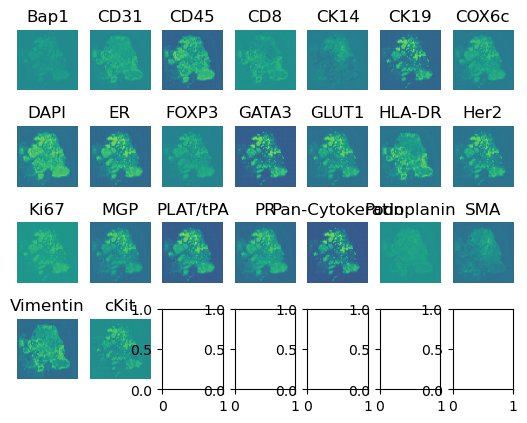

In [133]:
n_cols = 7
n_rows = len(channels) // n_cols + 1
rc = [(i, j) for i in range(n_rows) for j in range(n_cols)]

fig, axs = plt.subplots(ncols=n_cols, nrows=n_rows)
rc = [(i, j) for i in range(n_rows) for j in range(n_cols)]
for (row_idx, col_idx), c in zip(rc, channels):
    ax = axs[row_idx, col_idx]
    ax.imshow(x[channels.index(c)])
    ax.axis('off')
    ax.set_title(c)

In [134]:
ps = size[0] // 32
recon_embs = torch.stack(
    [inference_ds.slide_from_tiles(
        rearrange(all_encoded_tokens, 'n h w c -> n c h w'),
        i, size=(ps, ps))
    for i in range(len(inference_ds.slides))]
)
recon_embs = rearrange(recon_embs, 'b c h w -> b h w c')
recon_embs.shape

torch.Size([4, 52, 52, 1024])

In [57]:
recon_embs_prequant = torch.stack(
    [inference_ds.slide_from_tiles(
        rearrange(all_encoded_tokens_prequantize, 'n h w c -> n c h w'),
        i, size=(ps, ps))
    for i in range(len(inference_ds.slides))]
)
recon_embs_prequant = rearrange(recon_embs_prequant, 'b c h w -> b h w c')
recon_embs_prequant.shape

torch.Size([4, 52, 52, 1024])

In [135]:
recon_multi = torch.stack(
    [inference_ds.image_from_tiles(inference_ds.slide_to_tiles[s])
    for s in inference_ds.slides]
)
recon_multi = TF.resize(recon_multi, (52, 52))
recon_multi.shape

torch.Size([4, 23, 52, 52])

In [59]:
recon_indices = torch.stack(
    [inference_ds.slide_from_tiles(
        rearrange(all_indices, 'n h w -> n 1 h w'),
        i, size=(ps, ps))
    for i in range(len(inference_ds.slides))]
)
recon_indices = rearrange(recon_indices, 'b c h w -> b h w c').to(torch.long).squeeze()
recon_indices.shape

torch.Size([4, 52, 52])

In [136]:
def display_labeled_as_rgb(labeled, cmap=None):
    if isinstance(labeled, torch.Tensor):
        labeled = labeled.numpy()
    cmap = sns.color_palette() if cmap is None else cmap
    labels = sorted(np.unique(labeled))
    if len(cmap) < len(labels):
        raise RuntimeError('cmap is too small')
    new = np.zeros((labeled.shape[0], labeled.shape[1], 3))
    for l in labels:
        c = cmap[l]
        new[labeled==l] = c
    return new

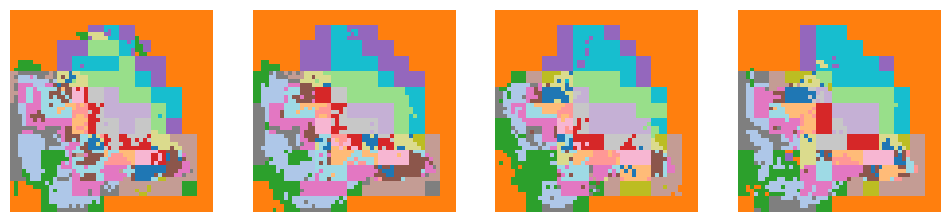

In [269]:
import seaborn as sns
cmap = sns.color_palette('tab20') + sns.color_palette('tab20b') + sns.color_palette('tab20c')
fig, axs = plt.subplots(ncols=recon_indices.shape[0], figsize=(12, 6))
for i, labeled in enumerate(recon_indices):
    axs[i].imshow(display_labeled_as_rgb(labeled, cmap=cmap))
    axs[i].axis('off')

In [74]:
recon_embs_prequant.shape

torch.Size([4, 52, 52, 1024])

In [75]:
mae.vq.codebook.shape

torch.Size([20, 1024])

In [76]:
dists = torch.cdist(
    rearrange(recon_embs_prequant, 'b h w d -> (b h w) d'),
    mae.vq.codebook
)
b, h, w, *_ = recon_embs_prequant.shape
dists = rearrange(dists, '(b h w) d -> b h w d', b=b, h=h, w=w)
dists.shape

torch.Size([4, 52, 52, 20])

In [77]:
import seaborn as sns
from scipy.ndimage import binary_fill_holes

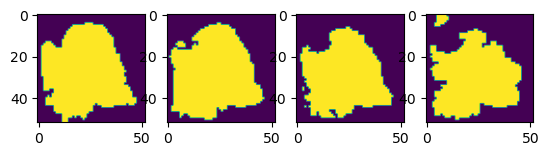

In [78]:
blurred_multi = TF.gaussian_blur(recon_multi, [3, 3])
multiplex_masks = blurred_multi[:, channels.index('DAPI')] > 4.8
multiplex_masks = torch.stack([
    torch.tensor(binary_fill_holes(mask.numpy()))
    for mask in multiplex_masks
])

fig, axs = plt.subplots(ncols=len(multiplex_masks))
for mask, ax in zip(multiplex_masks, axs):
    ax.imshow(mask)

In [79]:
# cluster_ids[~multiplex_masks] = cluster_ids.max() + 1
dists[~multiplex_masks] = dists.amax((0, 1, 2))

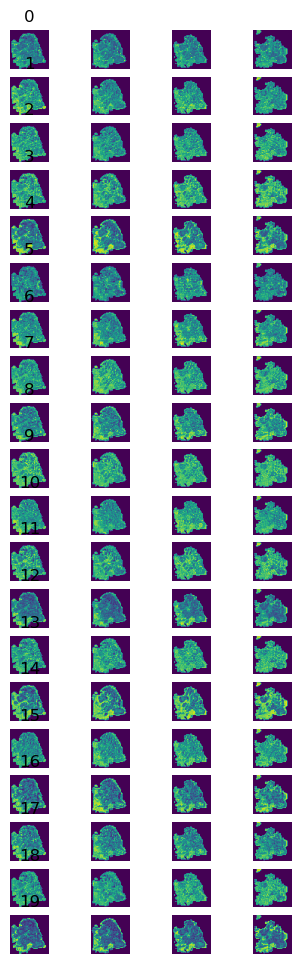

In [80]:
fig, axs = plt.subplots(ncols=dists.shape[0], nrows=dists.shape[-1], figsize=(4, 12))
for r in range(dists.shape[-1]):
    for c in range(dists.shape[0]):
        ax = axs[r, c]
        img = dists[c, ..., r]
        ax.imshow(img, cmap='viridis_r')
        ax.axis('off')
        if c == 0:
            ax.set_title(r)

In [98]:
locations = np.asarray([2, 12, 22, 31])
locations -= locations.min()
locations

array([ 0, 10, 20, 29])

In [100]:
from torchio.transforms import Resize

In [101]:
scaler = 10.

In [102]:
dist_volume = torch.zeros(locations.max(), dists.shape[3], int(dists.shape[1] * scaler), int(dists.shape[2] * scaler))
for i in range(dists.shape[0] - 1):
    l1, l2 = locations[i], locations[i+1]
    stack = rearrange(dists[i:i+2], 'b h w c -> c b h w')
    transform = Resize((l2 - l1, int(stack.shape[-2] * scaler), int(stack.shape[-1] * scaler)))
    out = transform(stack)
    dist_volume[l1:l2] = rearrange(out, 'c b h w -> b c h w')
dist_volume.shape

torch.Size([29, 20, 520, 520])

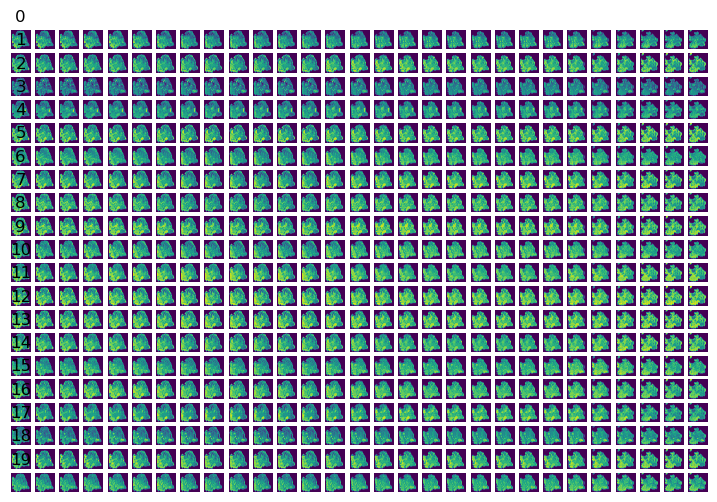

In [105]:
fig, axs = plt.subplots(ncols=dist_volume.shape[0], nrows=dist_volume.shape[1], figsize=(9, 6))
for r in range(dist_volume.shape[1]):
    for c in range(dist_volume.shape[0]):
        ax = axs[r, c]
        img = dist_volume[c, r]
        ax.imshow(img, cmap='viridis_r')
        ax.axis('off')
        if c == 0:
            ax.set_title(r)

In [106]:
to_save = dist_volume.max() - dist_volume
to_save /= to_save.max()
to_save *= 255.
to_save = to_save.to(torch.uint8).numpy()
to_save.shape

(29, 20, 520, 520)

In [107]:
result_dir = os.path.join(out_dir, 'results')
Path(result_dir).mkdir(parents=True, exist_ok=True)

In [108]:
for cluster in range(to_save.shape[1]):
    tifffile.imsave(os.path.join(result_dir, f'cluster_{cluster}.tif'), to_save[:, cluster, :, :])

In [109]:
d = {
    'recon_embs': recon_embs,
    'recon_imgs': recon_multi,
    'recon_embs_prequant': recon_embs_prequant,
    'recon_cluster_ids': recon_indices,
    'recon_cluster_dists': dists,
    'dists_volume': dist_volume
}
torch.save(d, os.path.join(result_dir, 'results_1000iter.pt'))

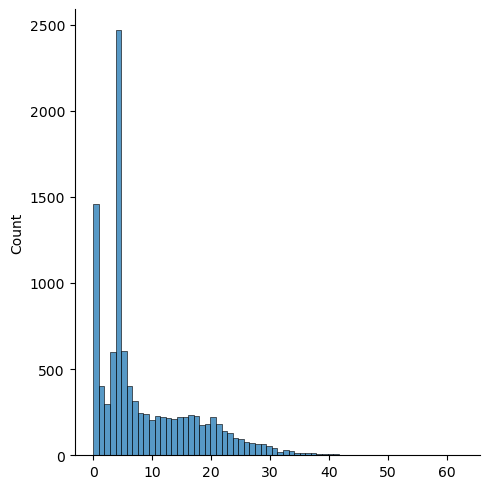

In [137]:
import seaborn as sns
blurred_multi = TF.gaussian_blur(recon_multi, [3, 3])
sns.displot(blurred_multi[:, channels.index('DAPI')].flatten().numpy())

In [138]:
from scipy.ndimage import binary_fill_holes

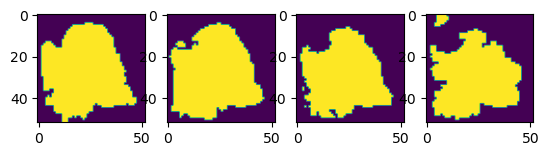

In [139]:
multiplex_masks = blurred_multi[:, channels.index('DAPI')] > 4.8
multiplex_masks = torch.stack([
    torch.tensor(binary_fill_holes(mask.numpy()))
    for mask in multiplex_masks
])

fig, axs = plt.subplots(ncols=len(multiplex_masks))
for mask, ax in zip(multiplex_masks, axs):
    ax.imshow(mask)

In [140]:
multiplex_masks.shape

torch.Size([4, 52, 52])

In [141]:
target = recon_embs.numpy()
target.shape

(4, 52, 52, 1024)

In [142]:
rc = torch.zeros(all_encoded_tokens.shape[:-1], dtype=torch.long)
print(rc.shape)
idx_to_var = [(r, c) for r in range(rc.shape[1]) for c in range(rc.shape[2])]
var_to_idx = {v:i for i, v in enumerate(idx_to_var)}
for i, (slide_idx, row_idx, col_idx) in enumerate(inference_ds.idx_to_coord):
    for r in range(rc.shape[1]):
        for c in range(rc.shape[2]):
            rc[i, r, c] = var_to_idx[(r, c)]
hots = torch.nn.functional.one_hot(rc)

X_coords = torch.stack(
    [inference_ds.slide_from_tiles(
        rearrange(hots, 'n h w c -> n c h w'),
        i, size=(ps, ps))
    for i in range(len(inference_ds.slides))]
)
X_coords = rearrange(X_coords, 'b c h w -> b h w c')
X_coords.shape

torch.Size([676, 8, 8])


torch.Size([4, 52, 52, 64])

In [143]:
from einops import repeat
X_slides = repeat(torch.arange(multiplex_masks.shape[0]), 'b -> b h w', h=52, w=52)
X_slides = torch.nn.functional.one_hot(X_slides)
X_slides.shape


torch.Size([4, 52, 52, 4])

In [144]:
X = torch.cat((X_coords, X_slides), dim=-1)
X = X.numpy()
X.shape

(4, 52, 52, 68)

In [145]:
target = rearrange(target, 'b h w c -> (b h w) c')
X = rearrange(X, 'b h w c -> (b h w) c')
target.shape, X.shape

((10816, 1024), (10816, 68))

In [146]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X, target)
residuals = lm.predict(X) - target
embs_regressed = rearrange(residuals, '(b h w) c -> b h w c',
                           b=X_coords.shape[0], h=X_coords.shape[1], w=X_coords.shape[2])
embs_regressed.shape

(4, 52, 52, 1024)

In [147]:
from sklearn.cluster import KMeans

In [148]:
n_clusters = 20
clusterer = KMeans(n_clusters=n_clusters)

In [149]:
tokens = torch.tensor(embs_regressed)
# tokens = recon_embs
tokens.shape

torch.Size([4, 52, 52, 1024])

In [150]:
# x = rearrange(tokens, 'b h w d -> (b h w) d').numpy()
x = tokens[multiplex_masks].numpy()
clusterer.fit(x)
dists = clusterer.transform(rearrange(tokens, 'b h w d -> (b h w) d').numpy())
cluster_ids = torch.tensor(dists.argmin(1))
cluster_ids.shape

torch.Size([10816])

In [151]:
cluster_ids = rearrange(cluster_ids, '(b h w) -> b h w',
                        b=tokens.shape[0], h=tokens.shape[1], w=tokens.shape[2])
dists = rearrange(torch.tensor(dists), '(b h w) d -> b h w d',
                 b=tokens.shape[0], h=tokens.shape[1], w=tokens.shape[2])
cluster_ids.shape

torch.Size([4, 52, 52])

In [152]:
cluster_ids[~multiplex_masks] = cluster_ids.max() + 1
dists[~multiplex_masks] = dists.amax((0, 1, 2))

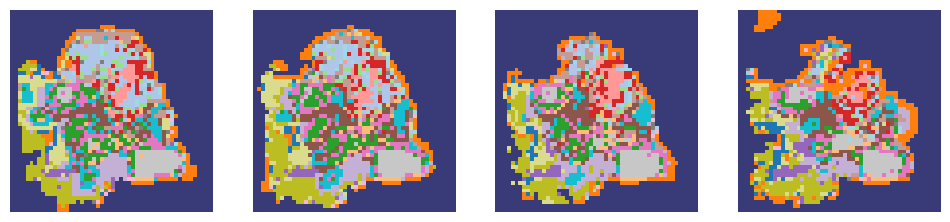

In [153]:
cmap = sns.color_palette('tab20') + sns.color_palette('tab20b') + sns.color_palette('tab20c')
fig, axs = plt.subplots(ncols=cluster_ids.shape[0], figsize=(12, 6))
for i, labeled in enumerate(cluster_ids):
    axs[i].imshow(display_labeled_as_rgb(labeled, cmap=cmap))
    axs[i].axis('off')

In [154]:
labeled = cluster_ids[0]
labeled.shape

torch.Size([52, 52])

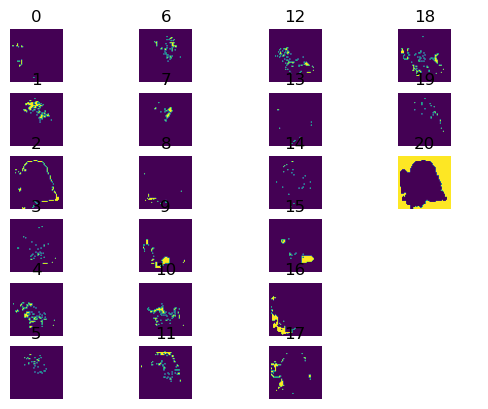

In [155]:

ncols = 4
nrows = (n_clusters + 1) // ncols + 1
    
coords = np.stack(np.meshgrid(np.arange(nrows), np.arange(ncols)))
coords = rearrange(coords, 'd h w -> (h w) d')

fig, axs = plt.subplots(nrows=nrows, ncols=ncols)
for i, (r, c) in zip(range(n_clusters + 1), coords):
    m = labeled==i
    axs[r, c].imshow(m)
    axs[r, c].set_title(i)

for ax in axs.flatten():
    ax.axis('off')
    

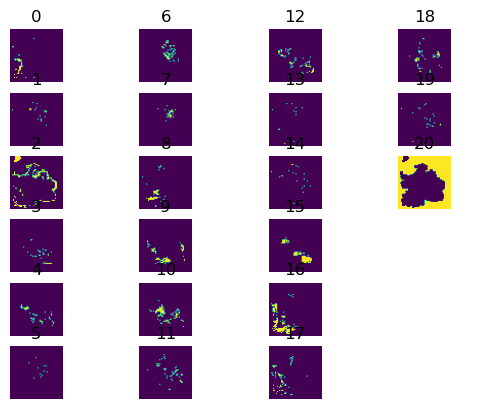

In [156]:
labeled = cluster_ids[-1]

fig, axs = plt.subplots(nrows=nrows, ncols=ncols)
for i, (r, c) in zip(range(n_clusters + 1), coords):
    m = labeled==i
    axs[r, c].imshow(m)
    axs[r, c].set_title(i)

for ax in axs.flatten():
    ax.axis('off')

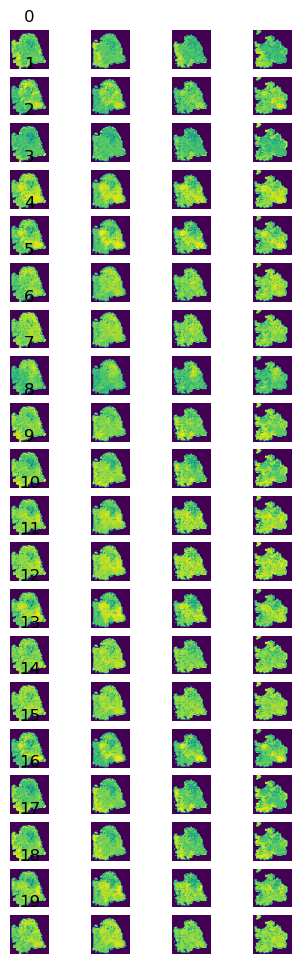

In [157]:
fig, axs = plt.subplots(ncols=dists.shape[0], nrows=n_clusters, figsize=(4, 12))
for r in range(n_clusters):
    for c in range(dists.shape[0]):
        ax = axs[r, c]
        img = dists[c, ..., r]
        ax.imshow(img, cmap='viridis_r')
        ax.axis('off')
        if c == 0:
            ax.set_title(r)

In [158]:
locations = np.asarray([2, 12, 22, 31])
locations -= locations.min()
locations

array([ 0, 10, 20, 29])

In [159]:
from torchio.transforms import Resize

In [160]:
scaler = 10.

In [161]:
dist_volume = torch.zeros(locations.max(), dists.shape[3], int(dists.shape[1] * scaler), int(dists.shape[2] * scaler))
for i in range(dists.shape[0] - 1):
    l1, l2 = locations[i], locations[i+1]
    stack = rearrange(dists[i:i+2], 'b h w c -> c b h w')
    transform = Resize((l2 - l1, int(stack.shape[-2] * scaler), int(stack.shape[-1] * scaler)))
    out = transform(stack)
    dist_volume[l1:l2] = rearrange(out, 'c b h w -> b c h w')
dist_volume.shape

torch.Size([29, 20, 520, 520])

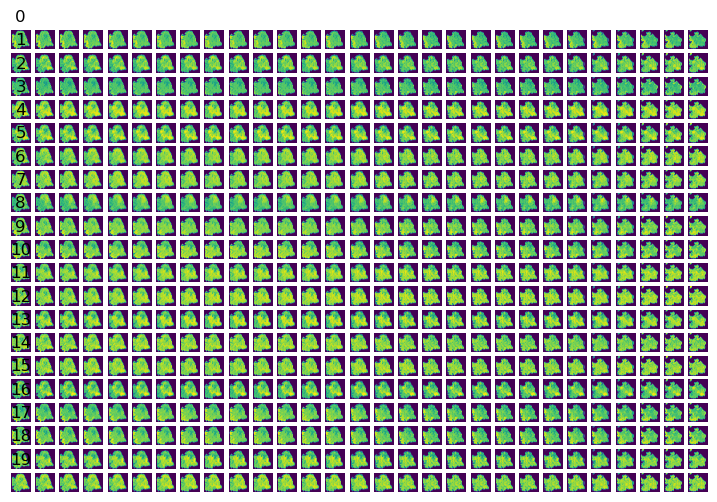

In [162]:
fig, axs = plt.subplots(ncols=dist_volume.shape[0], nrows=n_clusters, figsize=(9, 6))
for r in range(n_clusters):
    for c in range(dist_volume.shape[0]):
        ax = axs[r, c]
        img = dist_volume[c, r]
        ax.imshow(img, cmap='viridis_r')
        ax.axis('off')
        if c == 0:
            ax.set_title(r)

In [166]:
to_save = dist_volume.max() - dist_volume
to_save /= to_save.max()
to_save *= 255.
to_save = to_save.to(torch.uint8).numpy()
to_save.shape

(29, 20, 520, 520)

In [167]:
result_dir = '/data/estorrs/mushroom/data/mae_v13/results_100iter'
Path(result_dir).mkdir(parents=True, exist_ok=True)

In [168]:
for cluster in range(to_save.shape[1]):
    tifffile.imsave(os.path.join(result_dir, f'cluster_{cluster}.tif'), to_save[:, cluster, :, :])

In [169]:
d = {
    'recon_embs': recon_embs,
    'recon_imgs': recon_multi,
    'recon_embs_regressed': torch.tensor(embs_regressed),
    'recon_cluster_ids': cluster_ids,
    'recon_cluster_dists': dists,
    'distance_volume': dist_volume
}
torch.save(d, os.path.join(result_dir, 'results.pt'))

In [170]:
import pandas as pd
data = []
x = rearrange(recon_multi, 'b c h w -> b h w c')
for cluster in range(dists.shape[-1]):
    data.append(x[cluster_ids==cluster].mean(0).numpy())
data = np.vstack(data)
df = pd.DataFrame(data=data, columns=channels)
df

,Bap1,CD31,CD45,CD8,CK14,CK19,COX6c,DAPI,ER,FOXP3,...,Her2,Ki67,MGP,PLAT/tPA,PR,Pan-Cytokeratin,Podoplanin,SMA,Vimentin,cKit
0,0.048319,0.441176,1.073529,0.308824,0.728992,3.346639,0.613445,8.796219,1.052521,0.067227,...,0.035714,0.115546,6.262605,3.222689,13.592437,20.506302,0.245798,0.867647,11.111344,0.579832
1,0.233096,2.088968,5.400356,0.075623,2.919039,53.287365,1.357651,25.566727,23.302490,1.074733,...,1.452847,4.408363,23.967081,12.537367,21.285587,162.150360,0.765125,8.480427,19.950178,2.306940
2,0.019167,0.108750,0.204167,0.220833,0.989583,1.197083,0.043750,5.163333,0.170833,0.019583,...,0.014167,0.410000,2.367083,0.287917,0.759167,4.260417,0.179583,0.567917,2.902500,0.350833
3,0.113772,1.947605,4.077844,0.312874,0.350299,17.247005,0.764970,18.363773,7.880239,0.404192,...,0.336826,1.528443,7.850299,3.962575,10.103293,38.580837,0.279940,8.375749,43.365269,0.685629
4,0.175847,1.689972,5.541667,0.447034,0.413136,41.345341,1.062853,22.985170,15.814265,0.759181,...,0.629237,5.389124,8.492231,6.322740,15.943502,95.206215,0.355932,4.310734,29.832626,1.213277
5,0.095506,2.929775,2.578652,0.168539,8.196630,13.772472,0.876405,15.561798,5.511236,0.264045,...,0.359551,3.016854,14.258427,5.219101,12.783708,41.654495,0.547753,30.002810,46.598316,0.820225
6,0.114739,1.658582,2.454291,0.167910,4.374067,7.722015,0.756530,14.185635,4.388060,0.239739,...,0.203358,2.560634,9.476679,4.277052,10.653918,25.995337,0.552239,22.384329,46.807835,0.731343
7,0.122727,1.480303,2.650000,0.031818,21.165152,11.681818,1.031818,15.545455,6.357576,0.354545,...,0.321212,2.689394,15.348485,6.077273,7.457576,45.972729,1.259091,38.762123,50.742424,0.866667
8,0.058929,5.275000,1.948214,0.791071,0.555357,1.232143,0.887500,13.762500,2.678571,0.144643,...,0.192857,0.448214,12.535714,3.376786,11.207143,3.866071,0.748214,35.176785,42.310715,0.450000
9,0.027853,0.969429,0.617527,0.163723,0.639266,0.322011,0.180707,8.331522,0.936141,0.170516,...,0.046196,0.631793,2.718750,1.105299,3.679348,1.495924,0.163723,3.014946,25.944973,0.263587


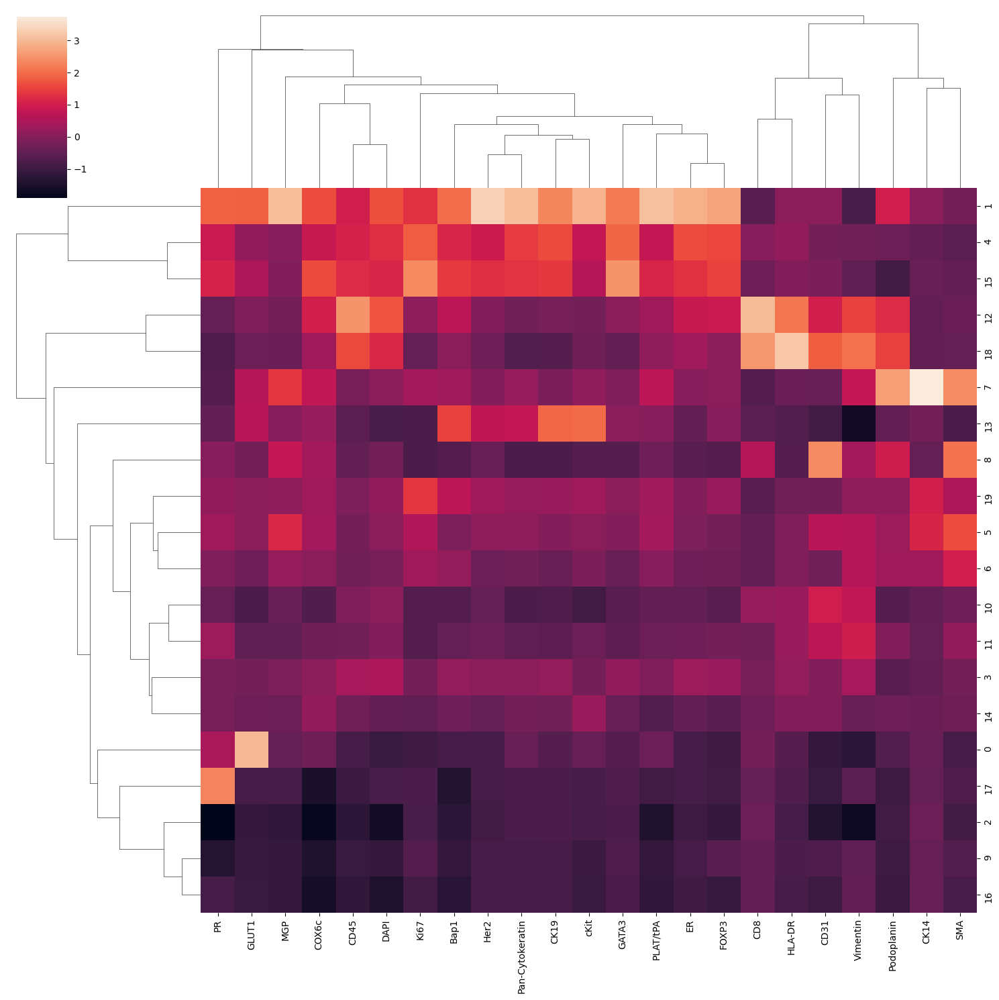

In [171]:
sns.clustermap(df, figsize=(15, 15), z_score=True)